## Import Libraries

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def read(path):
    img=cv2.imread(path)
    return img

def read_convertgray(path):
    imgray=cv2.imread(path,cv2.IMREAD_GRAYSCALE)
    return imgray

def read_convertBGRtoRGB(path):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def write(rgb_img,new_path):
    """
    Take an rgb image then, convert it to bgr image.
    Save the result in new_path location.
    """
    img = cv2.cvtColor(rgb_img, cv2.COLOR_RGB2BGR)
    cv2.imwrite(new_path, img)

def show_img_cv(img,name="default"):
    cv2.imshow(name,img)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

def show_img(img,text="Image"):
    fig = plt.figure(figsize=(10, 20))
    ax1 = fig.add_subplot(1, 1, 1)
    ax1.axis("off")
    ax1.title.set_text(text)
    ax1.imshow(img)

def visu(image,new_image,before="Before",after="After"):
    fig = plt.figure(figsize=(25, 45))

    ax1 = fig.add_subplot(2, 2, 1)
    ax1.axis("off")
    ax1.title.set_text(before)
    ax2 = fig.add_subplot(2, 2, 2)
    ax2.axis("off")
    ax2.title.set_text(after)

    ax1.imshow(image)
    ax2.imshow(new_image)

def grayscale_histogram(path):
    img = cv2.imread(path,0)
    hi= [0]*256
    rows= img.shape[0]
    cols= img.shape[1]
    for r in range(rows-1):
        for c in range(cols-1):
            pixel = img[r,c]
            hi[pixel] += 1
    plt.plot(hi)
    plt.show()

def grayscale_histogram2(img):

    hi= [0]*256
    rows= img.shape[0]
    cols= img.shape[1]
    for r in range(rows-1):
        for c in range(cols-1):
            pixel = img[r,c]
            hi[pixel] += 1
    plt.plot(hi)
    plt.show()


def color_histogram(path,title='Histogram Analysis'):
    img = cv2.imread(path)
    color = ('blue', 'green', 'red')


    for i,color in enumerate(color):
        histogram = cv2.calcHist([img],[i],None,[256],[0,256])

        plt.plot(histogram, color=color, label=color+' channel')
        plt.xlim([0,256])

    plt.title(title,fontsize=15)
    plt.xlabel('Range intensity values',fontsize=10)
    plt.ylabel('Count of Pixels',fontsize=10)
    plt.legend()
    plt.show()

## Import Images


In [3]:
task="/content/Sample Existing Doc_page-0001.jpg"

In [4]:
img=read_convertgray(task)

mean_value= np.mean(img)
print(mean_value)

196.31728416758705


In [5]:
mean_value=int(mean_value+1)
mean_value

197

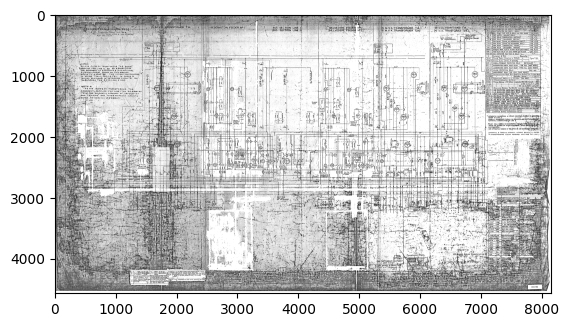

In [6]:
ret,thresh1 = cv2.threshold(img,mean_value,255,cv2.THRESH_BINARY)

plt.imshow(thresh1,cmap="gray")
plt.show()

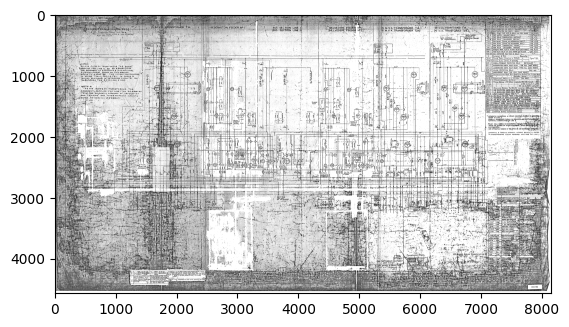

True

In [7]:
th3 = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                          cv2.THRESH_BINARY, 51, 5)


plt.imshow(th3,cmap="gray")
plt.show()


task4_1="/content/Sample Existing Doc_page-0001.jpg"

cv2.imwrite(task4_1, th3)

In [8]:
img = cv2.imread(task4_1,0)
kernel = np.ones((2,2),np.uint8)

## ITERATION 1

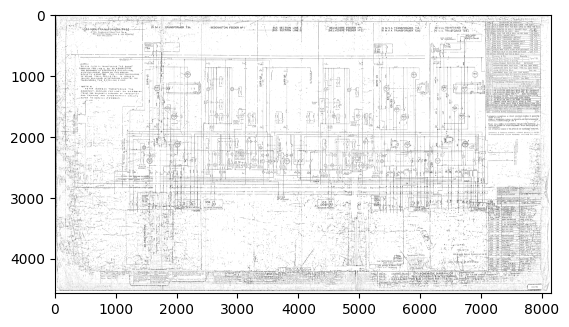

In [9]:
dilation = cv2.dilate(thresh1,kernel,iterations = 1)
plt.imshow(dilation,cmap="gray")
plt.show()

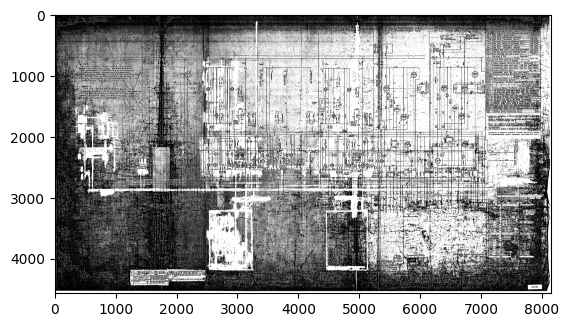

In [10]:
erosion = cv2.erode(img,kernel,iterations = 1)

plt.imshow(erosion,cmap="gray")
plt.show()

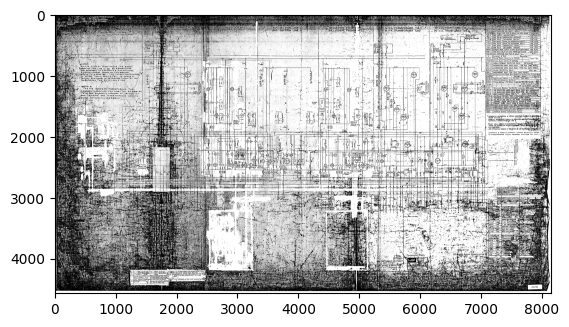

In [11]:
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
plt.imshow(opening,cmap="gray")
plt.show()

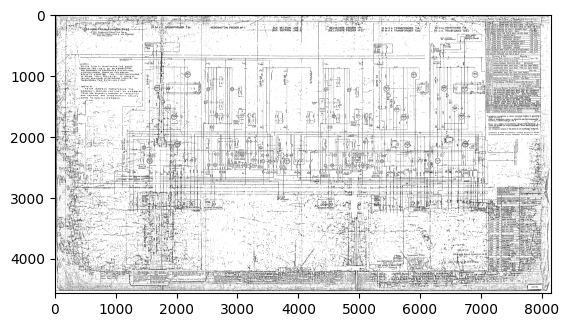

In [12]:
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
plt.imshow(closing,cmap="gray")
plt.show()

In [13]:
'''from google.colab import files
Iter_result_1 =  closing

# Save the processed image locally
cv2.imwrite("Iter_result_1.png", Iter_result_1)

# Download the processed image
files.download("Iter_result_1.png")'''

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [14]:
#from google.colab import files
#dilation_img =  dilation

# Save the processed image locally
#cv2.imwrite("dilation_img.png", dilation_img)

# Download the processed image
#files.download("dilation_img.png")

In [15]:
#from google.colab import files
#erosion_img =  erosion

# Save the processed image locally
#cv2.imwrite("erosion_img.png", closing_img)

# Download the processed image
#files.download("erosion_img.png")

In [16]:
#from google.colab import files
#opening_img =  opening

# Save the processed image locally
#cv2.imwrite("opening_img.png", opening_img)

# Download the processed image
#files.download("opening_img.png")

## ITERATION 2

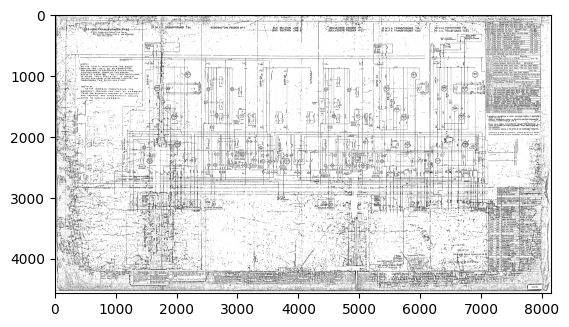

In [17]:
closed = cv2.morphologyEx(closing, cv2.MORPH_CLOSE, kernel)
plt.imshow(closed,cmap="gray")
plt.show()

## Sharpness

In [18]:
!pip install opencv-python-headless


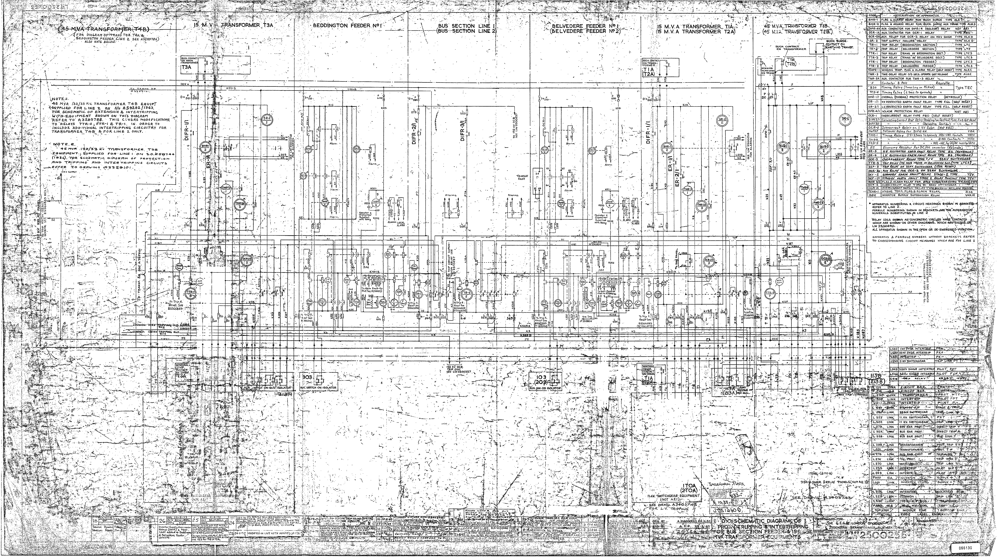

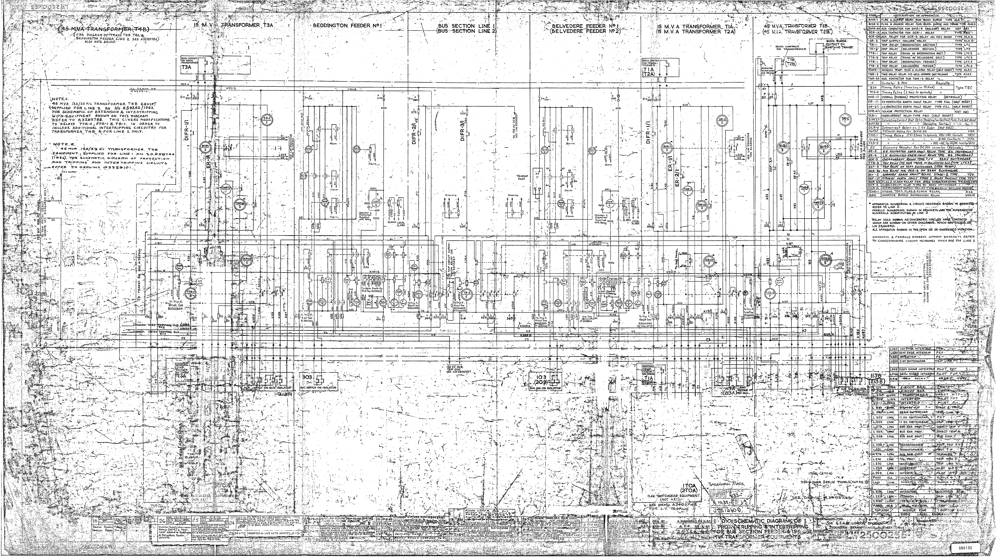

In [19]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow  # Required for displaying images in Colab

def sharpen_image(image):
    blurred = cv2.GaussianBlur(image, (0, 0), 3)
    sharpened = cv2.addWeighted(image, 3, blurred, -2, 0)
    return sharpened

# Read an image from URL (you can also upload an image file)
image = closed
# If you have already uploaded an image file, you can read it like this:
# image = cv2.imread('your_image.jpg')

# Sharpen the image
sharpened_image = sharpen_image(image)

# Display the original and sharpened images
cv2_imshow(image)
cv2_imshow(sharpened_image)


## Result

In [20]:
from google.colab import files
Iter_result_2_sharped=  sharpened_image

# Save the processed image locally
cv2.imwrite("Iter_result_2_sharped.png", Iter_result_2_sharped)

# Download the processed image
files.download("Iter_result_2_sharped.png")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>